# ДЗ

В этой домашней работе вам предстоит решить задачу ассоциации изображений методами metric learning. Необходимо обучить нейронную сеть для поиска похожих автомобилей из датасета cars196. Учтите, что для формирования предсказаний на тестовой выборке вы не должны предсказывать напрямую класс объекта (не используем метод прямой классификации). Пример формирования предсказаний можно найти в ноутбуке: [metric_learning.ipynb](metric_learning.ipynb) блок Faiss

В процессе решения нужно решить пункты:
1. Реализовать метрики: Precision@k, Recall@k, mAP 
2. Добавить train аугментации 
3. Обучить модель,
  * При обучении использовать backbone отличный от того, что использовался на семинаре (не ResNet50)
  *  Добавить triplet-loss (помните о грамотном формировании триплетов)
4. Рассчитать метрики из п.1
5. Показать с помощью град Кама, где ошибается модель


## Dataset: Задание выполнено на платформе kaggle, все используемые файлы расположены в публичном датасете:
### https://www.kaggle.com/datasets/timofeyst/hw8-association

In [1]:
import cv2
import os
import matplotlib.pyplot as plt
import random
import pandas as pd
import torch

device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [2]:
import scipy.io
mat = scipy.io.loadmat('/kaggle/input/hw8-association/devkit/devkit/cars_train_annos.mat')
fname_to_class = {fname:cl-1 for fname, cl in zip([i[0] for i in mat['annotations'][0]['fname']], 
                                                [i[0][0] for i in mat['annotations'][0]['class']])}
cars_meta = scipy.io.loadmat('/kaggle/input/hw8-association/devkit/devkit/cars_meta.mat')
id_to_car = {idx: car[0] for idx, car in enumerate(cars_meta['class_names'][0])}

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
ADD_PATH = '/kaggle/input/hw8-association/archive/cars_train/cars_train'

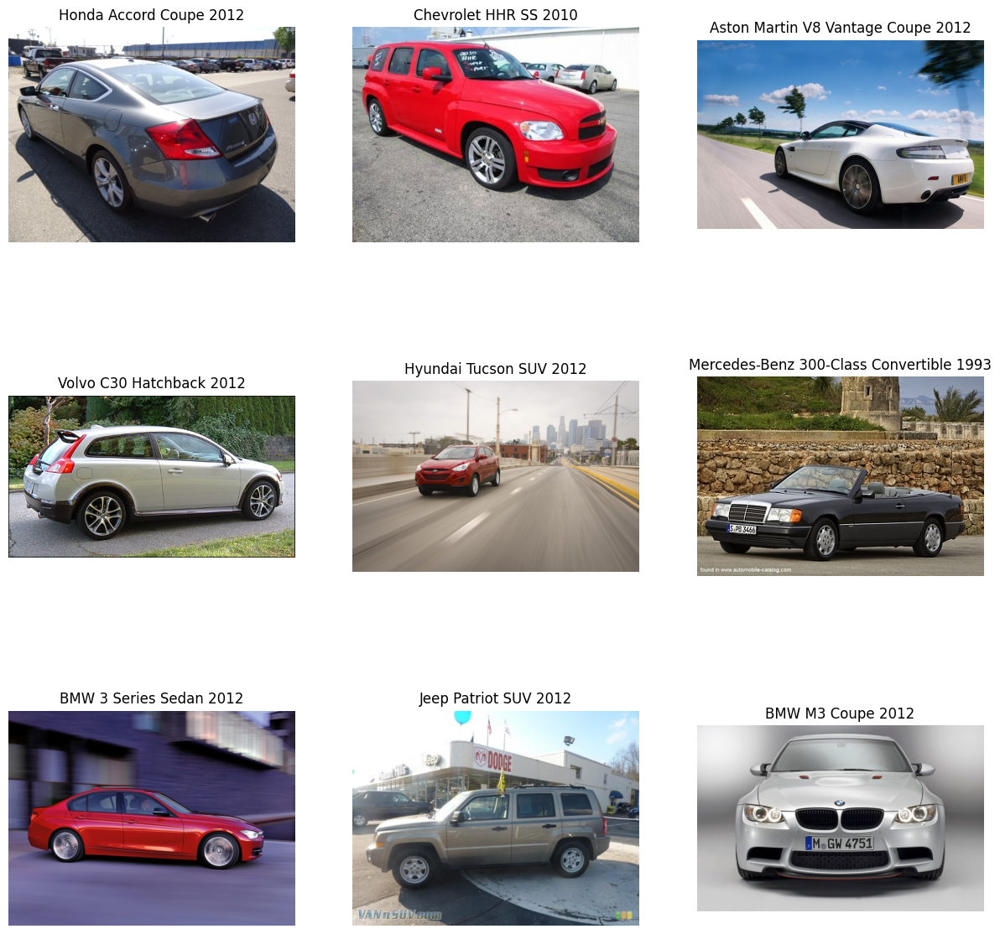

In [4]:
num_imgs = 9
cols = 3
rows = num_imgs // cols
fig, ax = plt.subplots(rows, cols, figsize = (15, 15))
for idx, im_idx in enumerate(random.sample([i for i in range(len(fname_to_class))], num_imgs)):
    filename, cl_id = list(fname_to_class.items())[im_idx]
    temp_image = cv2.imread(os.path.join(ADD_PATH, filename))
    temp_image = cv2.cvtColor(temp_image, cv2.COLOR_BGR2RGB)
    ax[idx//cols][idx%cols].imshow(temp_image)
    ax[idx//cols][idx%cols].set_title(f'{id_to_car[cl_id]}')
    ax[idx//cols][idx%cols].axis('off')

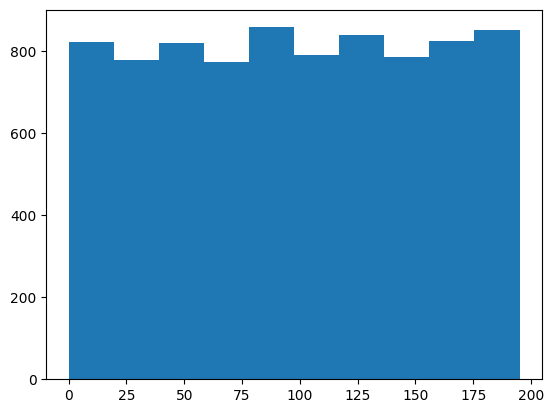

In [5]:
plt.hist(fname_to_class.values())
plt.show()

In [4]:
import torch
import torchvision
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split


# Добавим аугментаций
train_transforms = torchvision.transforms.Compose([
    torchvision.transforms.ToPILImage(),
    torchvision.transforms.Resize(
        size=(224, 224)
    ),
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.RandomRotation(degrees=(-15, 15)),
    torchvision.transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


val_transforms =  torchvision.transforms.Compose([
            torchvision.transforms.ToPILImage(),
            torchvision.transforms.Resize(
                size=(224, 224)
            ),
            torchvision.transforms.ToTensor(),
            torchvision.transforms.Normalize(
                mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]
            )
            ])
            

class CropClassifDataset(torch.utils.data.Dataset):
    def __init__(self, cars_items, transforms):
        self.cars = cars_items
        self.transforms = transforms

    def __len__(self):
        return len(self.cars)

    def __getitem__(self, idx):
        filename, cl_id = self.cars[idx]
        image = cv2.imread(os.path.join(ADD_PATH, filename))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        if self.transforms:
            image = self.transforms(image)
        sample = {'image': image, 'label': cl_id}
        return sample

In [5]:
items = list(fname_to_class.items())
random.shuffle(items)
train_items = items[:int(len(items) * 0.8)]
val_items = items[int(len(items) * 0.8):]

train_dataset = CropClassifDataset(train_items, train_transforms)
val_dataset = CropClassifDataset(val_items, val_transforms)


In [45]:
train_loader = DataLoader(train_dataset, batch_size=150, shuffle=True, num_workers=4, collate_fn=None, pin_memory=True, drop_last = True)
valid_loader = DataLoader(val_dataset, batch_size=150, shuffle=False, num_workers=4, collate_fn=None, pin_memory=True)

In [27]:
len(id_to_car)

196

## Center loss

In [7]:
import torch
import torch.nn as nn

class CenterLoss(nn.Module):
    """Center loss.
    
    Reference:
    Wen et al. A Discriminative Feature Learning Approach for Deep Face Recognition. ECCV 2016.
    
    Args:
        num_classes (int): number of classes.
        feat_dim (int): feature dimension.
    """
    def __init__(self, num_classes=10, feat_dim=2, device='cpu'):
        super(CenterLoss, self).__init__()
        self.num_classes = num_classes
        self.feat_dim = feat_dim
        
        self.centers = nn.Parameter(torch.randn(self.num_classes, self.feat_dim))


    def forward(self, x, labels):
        """
        Args:
            x: feature matrix with shape (batch_size, feat_dim).
            labels: ground truth labels with shape (batch_size).
        """
        self.centers = self.centers.to(device)
        batch_size = x.size(0)
        distmat = torch.pow(x, 2).sum(dim=1, keepdim=True).expand(batch_size, self.num_classes) + \
                  torch.pow(self.centers, 2).sum(dim=1, keepdim=True).expand(self.num_classes, batch_size).t()
        distmat.addmm_(1, -2, x, self.centers.t())

        classes = torch.arange(self.num_classes).long()
        classes = classes.to(device)
        labels = labels.unsqueeze(1).expand(batch_size, self.num_classes)
        mask = labels.eq(classes.expand(batch_size, self.num_classes))

        dist = distmat * mask.float()
        loss = dist.clamp(min=1e-12, max=1e+12).sum() / batch_size

        return loss

## Triplet loss

In [144]:
import torch
import torch.nn as nn
import random


class TripletLoss(nn.Module):
    def __init__(self, margin=0.2):
        super(TripletLoss, self).__init__()
        self.margin = margin

    def forward(self, preds, labels):
        """
        Args:
            embeddings: Feature embeddings of shape (batch_size, emb_size).
            labels: Ground truth labels of shape (batch_size).
        Returns:
            triplet_loss: Triplet loss.
        """

        triplet_loss = 0
        for i in range(len(preds)):
            anchor = preds[i]  # Текущее предсказание модели
            current_label = labels[i]  # Метка (label) текущего предсказания

            positive_indices = [j for j in range(len(labels)) if j != i and labels[j] == current_label]
            negative_indices = [j for j in range(len(labels)) if j != i and labels[j] != current_label]
            # Если в батче отсутствует позитивный или негативный элемент, то лосс не посчитаем, пропускаем
            if len(positive_indices) == 0 or len(negative_indices) == 0:
                continue

            # Выбор случайного положительного элемента с тем же label
            positive_index = random.choice(positive_indices)
            positive_pred = preds[positive_index]

            # Выбор случайного отрицательного элемента с другим label
            negative_index = random.choice(negative_indices)
            negative_pred = preds[negative_index]

            # Теперь вы можете вычислить евклидово расстояние между текущим предсказанием и положительным/отрицательным предсказанием
            distance_positive = torch.dist(anchor, positive_pred, p=2)
            distance_negative = torch.dist(anchor, negative_pred, p=2)

            triplet_loss += max(distance_positive - distance_negative + self.margin, 0)

        triplet_loss = triplet_loss.mean()
        if triplet_loss == 0:
            return torch.tensor(self.margin, dtype=preds[0].dtype, device=preds[0].device)
        
        return triplet_loss
    
#     def forward(self, embeddings, labels):
#         """
#         Args:
#             embeddings: Feature embeddings of shape (batch_size, emb_size).
#             labels: Ground truth labels of shape (batch_size).
#         Returns:
#             triplet_loss: Triplet loss.
#         """
#         # Pairwise distance matrix
#         pairwise_distances = torch.cdist(embeddings, embeddings)

#         anchor_positive_dist = pairwise_distances.unsqueeze(2).repeat(1, 1, embeddings.size(0))
#         anchor_negative_dist = pairwise_distances.unsqueeze(1).repeat(1, embeddings.size(0), 1)

#         triplet_loss = anchor_positive_dist - anchor_negative_dist + self.margin
#         mask = (labels.unsqueeze(0) == labels.unsqueeze(1)).float()
#         triplet_loss = triplet_loss * (1 - mask)

#         # Zero out the negative entries
#         triplet_loss[triplet_loss < 0] = 0

#         # Calculate the average triplet loss over all triplets
#         num_triplets = (triplet_loss > 1e-16).float().sum()
#         triplet_loss = triplet_loss.sum() / (num_triplets + 1e-16)

#         return triplet_loss

# TEST

In [18]:
batch = next(iter(train_loader))

In [37]:
tl = TripletLoss()

In [35]:
max(loss + 0.2, 0.2)
# torch.tensor(0.2, dtype=preds[0].dtype, device=preds[0].device)

tensor(1.8471, grad_fn=<AddBackward0>)

In [40]:
tl.forward(preds, labels)

tensor(1.2204, grad_fn=<DivBackward0>)

In [20]:
images = batch['image']
labels = batch['label'].to(torch.long)
preds = pl_model.model(images)

In [63]:
pairwise_distances = torch.cdist(preds, preds)
anchor_positive_dist = pairwise_distances.unsqueeze(2).repeat(1, 1, preds.size(0))
anchor_negative_dist = pairwise_distances.unsqueeze(1).repeat(1, preds.size(0), 1)

In [19]:
len(labels)
labels.unique().shape

torch.Size([127])

In [24]:
# preds.shape, pairwise_distances.shape, anchor_positive_dist.shape, anchor_negative_dist.shape
# pairwise_distances
import random

loss = 0
margin = 0.2
for i in range(len(preds)):
# for i in range(3):
    anchor = preds[i]  # Текущее предсказание модели
    current_label = labels[i]  # Метка (label) текущего предсказания
    
    positive_indices = [j for j in range(len(labels)) if j != i and labels[j] == current_label]
    negative_indices = [j for j in range(len(labels)) if j != i and labels[j] != current_label]
    if len(positive_indices) == 0 or len(negative_indices) == 0:
        continue
    
    # Выбор случайного положительного элемента с тем же label
    positive_index = random.choice(positive_indices)
    positive_pred = preds[positive_index]

    # Выбор случайного отрицательного элемента с другим label
    negative_index = random.choice(negative_indices)
    negative_pred = preds[negative_index]

    # Теперь вы можете вычислить евклидово расстояние между текущим предсказанием и положительным/отрицательным предсказанием
    distance_positive = torch.dist(anchor, positive_pred, p=2)
    distance_negative = torch.dist(anchor, negative_pred, p=2)
    
    loss += torch.relu(distance_positive - distance_negative + margin)

loss = loss / len(preds)

print(f"{loss=}")
    

loss=tensor(1.6471, grad_fn=<DivBackward0>)


# Test end

In [46]:
# %pip install lightning pytorch_metric_learning faiss-gpu

In [90]:
!rm -r /kaggle/working/lightning_logs

## Lightning Module

In [145]:
import lightning.pytorch as pl
from lightning.pytorch.callbacks import ModelCheckpoint
from lightning.pytorch.callbacks.early_stopping import EarlyStopping
from lightning.pytorch.callbacks import LearningRateMonitor
from torchvision.models import resnet50, mobilenet_v2
from pytorch_metric_learning import losses

class CarEmbedder(pl.LightningModule):
    def __init__(self, class_dict, learning_rate, emb_size):
        super().__init__()
        self.learning_rate = learning_rate
        self.model = mobilenet_v2(pretrained=True)

        self.model.fc = torch.nn.Sequential(
                            torch.nn.Linear(in_features=2048, out_features=emb_size))
        self.classifier_head = torch.nn.Sequential(
                            torch.nn.ReLU(),
                            torch.nn.Linear(in_features=emb_size, out_features=len(class_dict)))
        self.arc_face_loss = losses.ArcFaceLoss(len(class_dict), emb_size, margin=28.6, scale=64)
        self.classif_loss = torch.nn.CrossEntropyLoss()
        self.center_loss = CenterLoss(len(class_dict), emb_size, device)
        self.triplet_loss = TripletLoss(margin=0.2)
        self.alpha = 0.4

        self.save_hyperparameters()

    def training_step(self, batch, batch_idx):
        images = batch['image']
        labels = batch['label'].to(torch.long)
        preds = self.model(images)

        """
        ArcFace

        final_loss = self.arc_face_loss(preds, labels)
        """

        """
        CE + CenterLoss

        center_loss = self.center_loss(preds, labels)
        preds = self.classifier_head(preds)
        classif_loss = self.classif_loss(preds, labels)
        
        final_loss = center_loss * self.alpha + classif_loss
        """

        """
        Triplet loss
        
        """
        triplet_loss = self.triplet_loss(preds, labels)
        final_loss = triplet_loss
        
#         preds = self.classifier_head(preds)
#         classif_loss = self.classif_loss(preds, labels)
#         final_loss = triplet_loss * self.alpha + classif_loss

        self.log("train_loss", final_loss, sync_dist=True)
        return final_loss

    def validation_step(self, batch, batch_idx):
        images = batch['image']
        labels = batch['label'].to(torch.long)
        preds = self.model(images)

        """
        ArcFace

        final_loss = self.arc_face_loss(preds, labels)
        """

        """
        CE + CenterLoss

        center_loss = self.center_loss(preds, labels)
        preds = self.classifier_head(preds)
        classif_loss = self.classif_loss(preds, labels)
        final_loss = center_loss * self.alpha + classif_loss
        """
        
        """
        Triplet loss
        
        """
        triplet_loss = self.triplet_loss(preds, labels)
#         final_loss = triplet_loss
        
        preds = self.classifier_head(preds)
        classif_loss = self.classif_loss(preds, labels)
        final_loss = triplet_loss * self.alpha + classif_loss

        self.log("validation_loss", final_loss, sync_dist=True)

    def forward(self, images):
        if len(images.shape) == 4:
            preds = self.model(images)
        else:
            preds = self.model(images.unsqueeze(0))
        return preds

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        return [optimizer]

In [146]:
# model
pl_model = CarEmbedder(id_to_car, 3e-4, 1000)
checkpoint_callback = ModelCheckpoint(monitor='validation_loss',mode='min',  save_top_k=3)
early_stopping = EarlyStopping(monitor="validation_loss", mode="min", patience=2)
lr_monitor = LearningRateMonitor(logging_interval='step')

# train model
trainer = pl.Trainer(max_epochs = 10, accelerator=device, devices = 1, callbacks=[checkpoint_callback, early_stopping, lr_monitor])


INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs


In [147]:
trainer.fit(model=pl_model, train_dataloaders=train_loader, 
            val_dataloaders=valid_loader)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name            | Type             | Params
-----------------------------------------------------
0 | model           | MobileNetV2      | 5.6 M 
1 | classifier_head | Sequential       | 196 K 
2 | arc_face_loss   | ArcFaceLoss      | 196 K 
3 | classif_loss    | CrossEntropyLoss | 0     
4 | center_loss     | CenterLoss       | 196 K 
5 | triplet_loss    | TripletLoss      | 0     
-----------------------------------------------------
6.1 M     Trainable params
0         Non-trainable params
6.1 M     Total params
24.568    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=10` reached.


In [132]:
trainer.fit(model=pl_model, train_dataloaders=train_loader, 
            val_dataloaders=valid_loader)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name            | Type             | Params
-----------------------------------------------------
0 | model           | MobileNetV2      | 5.6 M 
1 | classifier_head | Sequential       | 196 K 
2 | arc_face_loss   | ArcFaceLoss      | 196 K 
3 | classif_loss    | CrossEntropyLoss | 0     
4 | center_loss     | CenterLoss       | 196 K 
5 | triplet_loss    | TripletLoss      | 0     
-----------------------------------------------------
6.1 M     Trainable params
0         Non-trainable params
6.1 M     Total params
24.568    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=40` reached.


In [149]:
torch.save(pl_model.state_dict(), "weights-mobilenet-10e-class.pth.tar")

In [150]:
import shutil

folder_to_zip = "./lightning_logs"
zip_filename = "lightning_logs"

shutil.make_archive(zip_filename, 'zip', folder_to_zip)
# shutil.move(zip_filename + '.zip', '/kaggle/working/' + zip_filename)

'/kaggle/working/lightning_logs.zip'

In [17]:
# pl_model.load_state_dict(torch.load("weights-mobilenet.pth.tar", map_location=device))
# pl_model.load_state_dict(torch.load("/kaggle/input/mobilenet-v2-11e/weights-mobilenet.pth (1).tar", map_location=device))

<All keys matched successfully>

# FAISS

In [151]:
import tqdm
import numpy as np
pl_model.eval()
pl_model.to(device)
1

1

In [123]:
def get_embeds(model, loader):
    embeddings = np.empty((1,1000)) # Выход с mobilenet 1000
    labels = np.empty((1))
    for batch in tqdm.tqdm_notebook(loader):
        imgs = batch['image']
        label = batch['label']
        with torch.no_grad():
            preds = model(imgs.to(device))
        embeddings = np.concatenate([embeddings, preds.cpu().numpy()])
        labels = np.concatenate([labels, label.numpy()])
    return embeddings[1:].astype(np.float32), labels[1:]

In [152]:
train_emb, train_labels = get_embeds(pl_model, train_loader)
val_emb, val_labels = get_embeds(pl_model, valid_loader)

/tmp/ipykernel_32/3876357873.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for batch in tqdm.tqdm_notebook(loader):


  0%|          | 0/43 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

In [ ]:
# %pip install faiss-gpu

In [122]:
import faiss                   # make faiss available
index = faiss.IndexFlatL2(1000)   # build the index
print(index.is_trained)
index.add(train_emb)                  # add vectors to the index
print(index.ntotal)

k = 4                          # we want to see 4 nearest neighbors
D, I = index.search(train_emb[:5], k) # sanity check
print(I)
print(D)
D, I = index.search(val_emb, k)     # actual search
print(I[:5])                   # neighbors of the 5 first queries
print(I[-5:]) 

True
6450
[[   0 1435 4447 2821]
 [   1 3590 5405 4034]
 [   2    7 3905 4164]
 [   3 2697 1374 1163]
 [   4 1151  891 5896]]
[[  0.      322.09076 351.64532 352.79437]
 [  0.      371.78177 380.94934 382.2135 ]
 [  0.      317.48663 317.95078 319.77408]
 [  0.      341.72614 343.08398 349.56653]
 [  0.      262.38644 330.29996 332.6856 ]]
[[1760 3878 3291 1010]
 [5711 1525 2463 4203]
 [1684  412 5741 4919]
 [4888 3015 1659 3615]
 [2904 1936   45 2528]]
[[ 814 1018 1280 2772]
 [3212 1621 3632 3321]
 [4592  248 2528 4364]
 [5181 3811 2575 5142]
 [4961    7  901  785]]


In [78]:
Distances, Indexes = index.search(val_emb, 1)

# Metrics

In [79]:
print(f'Precision @ 1 : {np.sum((val_labels == train_labels[Indexes.flatten()]))/val_labels.shape[0]}')

Precision @ 1 : 0.009208103130755065


In [66]:
Indexes.flatten().shape, train_labels[Indexes.flatten()].shape, val_labels.shape

((1629,), (1629,), (1629,))

In [117]:
import numpy as np
from tabulate import tabulate

def precision_at_k(y_true, y_pred, k):
    # Рассчитываем точность (Precision) при значении k
    true_positive = 0
    k = min(k, len(y_true))
    
    for i in range(len(y_true)):
        true_positive += (np.sum(y_true[i] == y_pred[i]) / k)
    
    precision = true_positive / len(y_true)
    return precision

def recall_at_k(y_true, y_pred, y_all, k):
    # Рассчитываем полноту (Recall) при значении k
    true_positive = 0
    false_negative = 0
    k = min(k, len(y_true))
    
    for i in range(len(y_true)):
        cur_tp = np.sum(y_true[i] == y_pred[i])
        true_positive += cur_tp
        false_negative += np.count_nonzero(y_all == y_true[i]) # заменить на y_true == y_true[i]
    
    recall = true_positive / (true_positive + false_negative)
    return recall

def mean_average_precision(y_true, y_pred, k):
    # Рассчитываем среднюю точность (mAP)
    mAP = 0
    k = min(k, len(y_true))
    
    for i in range(len(y_true)):
        num_correct = 0
        average_precision = 0
        for j in range(k):
            pred = y_true[i] == y_pred[i][j]
            num_correct += pred
            average_precision += num_correct / (j + 1)
        
        mAP += average_precision / k
    
    mAP = mAP / len(y_true)
    return mAP

def show_metrics(y_true, index, k=1):
    Distances, Indexes = index.search(val_emb, k)

    y_true = y_true.astype(int)
    y_pred = train_labels[Indexes].astype(int)
    
    precision = precision_at_k(y_true, y_pred, k)
    recall = recall_at_k(y_true, y_pred, val_labels, k)
    mAP = mean_average_precision(y_true, y_pred, k)

    precision_str = f"{precision:.5f}"
    recall_str = f"{recall:.5f}"
    mAP_str = f"{mAP:.5f}"

    data = [["Precision", precision_str],
            ["Recall", recall_str],
            ["mAP", mAP_str]]

    table = tabulate(data, headers=["Metric", f"@{k}"], tablefmt="pretty")
    print(table)

In [118]:
# margin 0.2 epochs = 5
show_metrics(y_true=val_labels, index=index, k=12)

+-----------+---------+
|  Metric   |   @12   |
+-----------+---------+
| Precision | 0.13316 |
|  Recall   | 0.14561 |
|    mAP    | 0.16476 |
+-----------+---------+


In [127]:
# margin 0.2 epochs = 12
show_metrics(y_true=val_labels, index=index, k=12)

+-----------+---------+
|  Metric   |   @12   |
+-----------+---------+
| Precision | 0.00445 |
|  Recall   | 0.00566 |
|    mAP    | 0.00397 |
+-----------+---------+


In [139]:
# margin 0.2 epochs = 40
show_metrics(y_true=val_labels, index=index, k=12)

+-----------+---------+
|  Metric   |   @12   |
+-----------+---------+
| Precision | 0.00588 |
|  Recall   | 0.00747 |
|    mAP    | 0.00421 |
+-----------+---------+


In [153]:
# margin 0.2 epochs = 10 Classif head
show_metrics(y_true=val_labels, index=index, k=12)

+-----------+---------+
|  Metric   |   @12   |
+-----------+---------+
| Precision | 0.00414 |
|  Recall   | 0.00528 |
|    mAP    | 0.00451 |
+-----------+---------+


In [153]:
# BAD Triplet loss
# margin 0.2
show_metrics(y_true=val_labels, index=index, k=12)

+-----------+---------+
|  Metric   |   @12   |
+-----------+---------+
| Precision | 0.01008 |
|  Recall   | 0.12093 |
|    mAP    | 0.00969 |
+-----------+---------+


In [179]:
# BAD Triplet loss
# margin 0.1
show_metrics(y_true=val_labels, index=index, k=12)

+-----------+---------+
|  Metric   |   @12   |
+-----------+---------+
| Precision | 0.00481 |
|  Recall   | 0.05770 |
|    mAP    | 0.00534 |
+-----------+---------+


In [220]:
# BAD Triplet loss
# margin 0.001
show_metrics(y_true=val_labels, index=index, k=12)

+-----------+---------+
|  Metric   |   @12   |
+-----------+---------+
| Precision | 0.00542 |
|  Recall   | 0.06507 |
|    mAP    | 0.00506 |
+-----------+---------+


# GradCam

In [85]:
# %pip install grad-cam

In [84]:
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import numpy as np

In [86]:
transform_to_show = torchvision.transforms.Compose([
                        torchvision.transforms.ToPILImage(), 
                        torchvision.transforms.Resize(
                            size=(224, 224)
                        ),
                        torchvision.transforms.ToTensor()
                        ])

def show_diff_grad_methods(model, methods):
    model.eval()
    num_imgs = 4
    rows = len(methods)
    fig, ax = plt.subplots(rows, num_imgs, figsize = (30, 30))
    random_images = random.sample([i for i in range(len(fname_to_class))], num_imgs)
    for row_id, method in enumerate(methods):
        for col_id, im_idx in enumerate(random_images):
            filename, cl_id = list(fname_to_class.items())[im_idx]
            temp_image = cv2.imread(os.path.join(ADD_PATH, filename))
            temp_image = cv2.cvtColor(temp_image, cv2.COLOR_BGR2RGB)
            rgb_im = np.array(transform_to_show(temp_image).permute(1,2,0))
            transformed_im = val_transforms(temp_image).unsqueeze(0).to(device)
            target_layers = [model.features[7]]
            cam = method(model=model, target_layers=target_layers, use_cuda=True)
            grayscale_cam = cam(input_tensor=transformed_im)
            grayscale_cam = grayscale_cam[0, :]
            visualization = show_cam_on_image(rgb_im, grayscale_cam, use_rgb=True)
            ax[row_id][col_id].imshow(visualization)
            ax[row_id][col_id].set_title(f"method : {str(method).split('.')[-1][:-2]} \n gt : {id_to_car[cl_id]}")
            ax[row_id][col_id].axis('off')




100%|██████████| 4/4 [00:00<00:00, 92.97it/s]


100%|██████████| 4/4 [00:00<00:00, 94.69it/s]


100%|██████████| 4/4 [00:00<00:00, 95.20it/s]


100%|██████████| 4/4 [00:00<00:00, 98.28it/s]


100%|██████████| 2/2 [00:00<00:00, 47.69it/s]


100%|██████████| 2/2 [00:00<00:00, 47.29it/s]


100%|██████████| 2/2 [00:00<00:00, 47.74it/s]


100%|██████████| 2/2 [00:00<00:00, 47.68it/s]


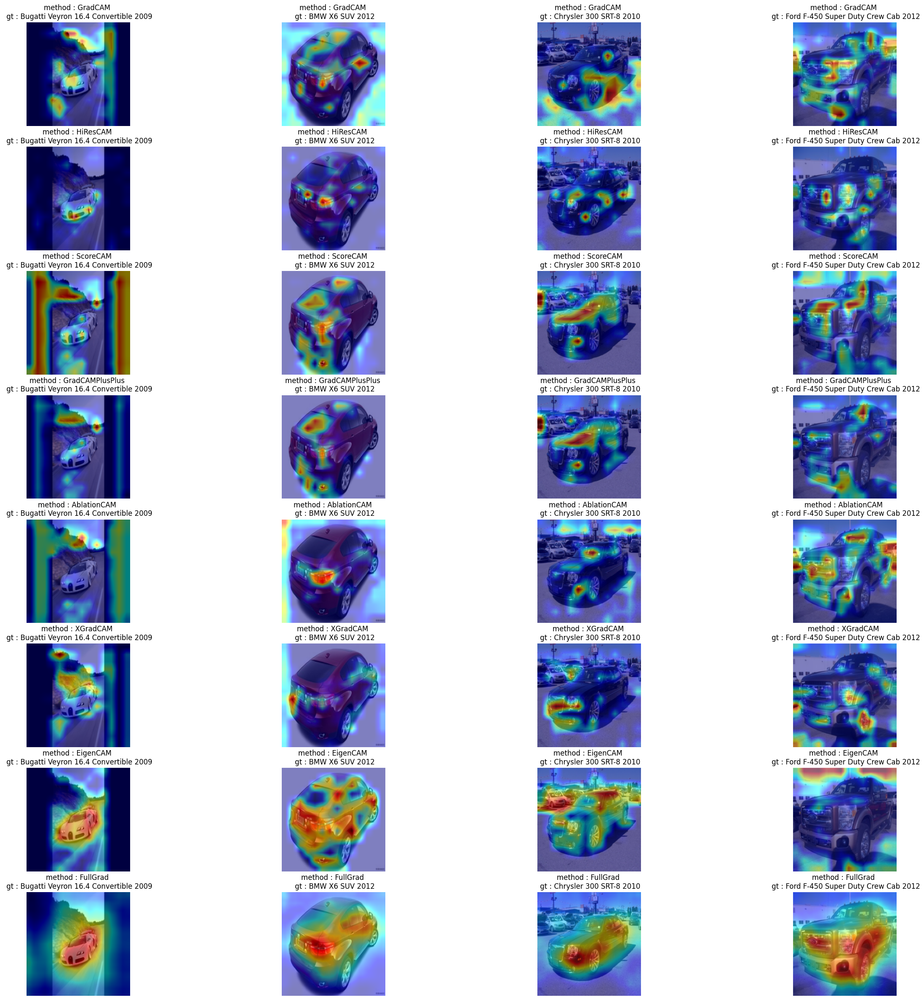

In [154]:
show_diff_grad_methods(pl_model.model, [ GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad])


100%|██████████| 4/4 [00:00<00:00, 95.60it/s]

100%|██████████| 4/4 [00:00<00:00, 95.56it/s]

100%|██████████| 4/4 [00:00<00:00, 99.40it/s]

100%|██████████| 4/4 [00:00<00:00, 100.40it/s]

100%|██████████| 2/2 [00:00<00:00, 47.98it/s]

100%|██████████| 2/2 [00:00<00:00, 47.62it/s]

100%|██████████| 2/2 [00:00<00:00, 48.04it/s]

100%|██████████| 2/2 [00:00<00:00, 42.04it/s]


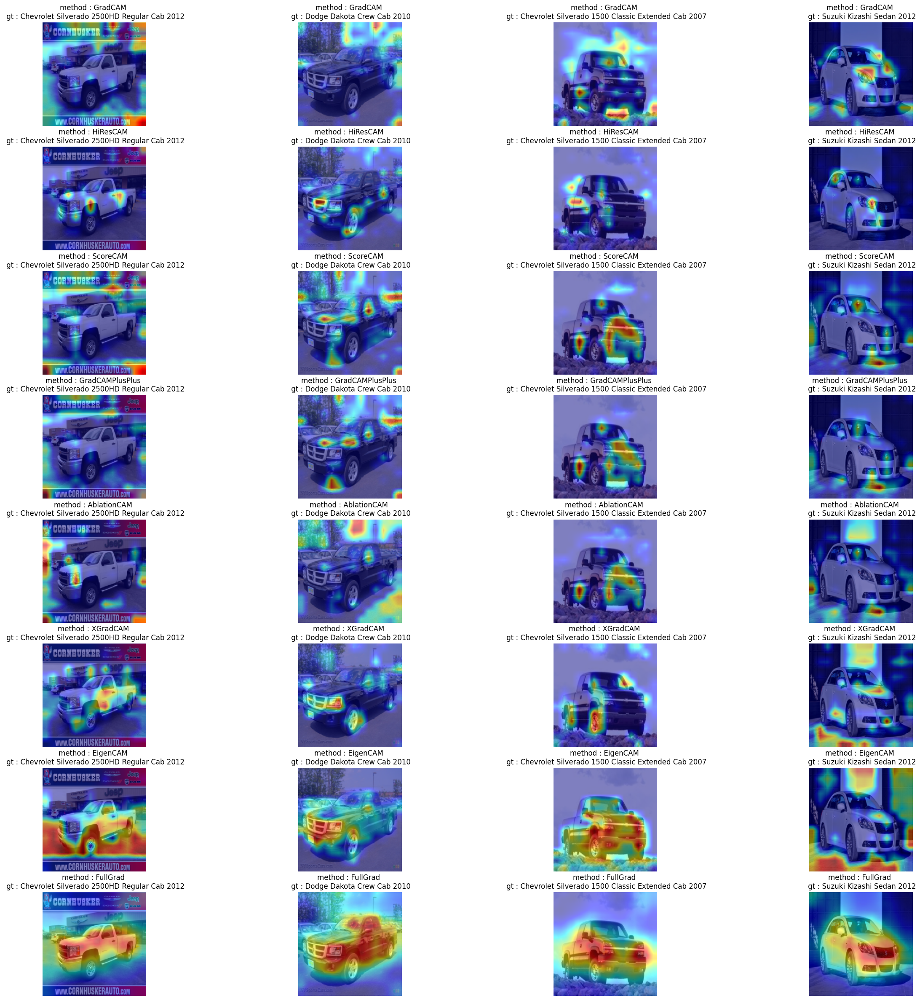

In [140]:
show_diff_grad_methods(pl_model.model, [ GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad])

100%|██████████| 2/2 [00:00<00:00, 48.58it/s]


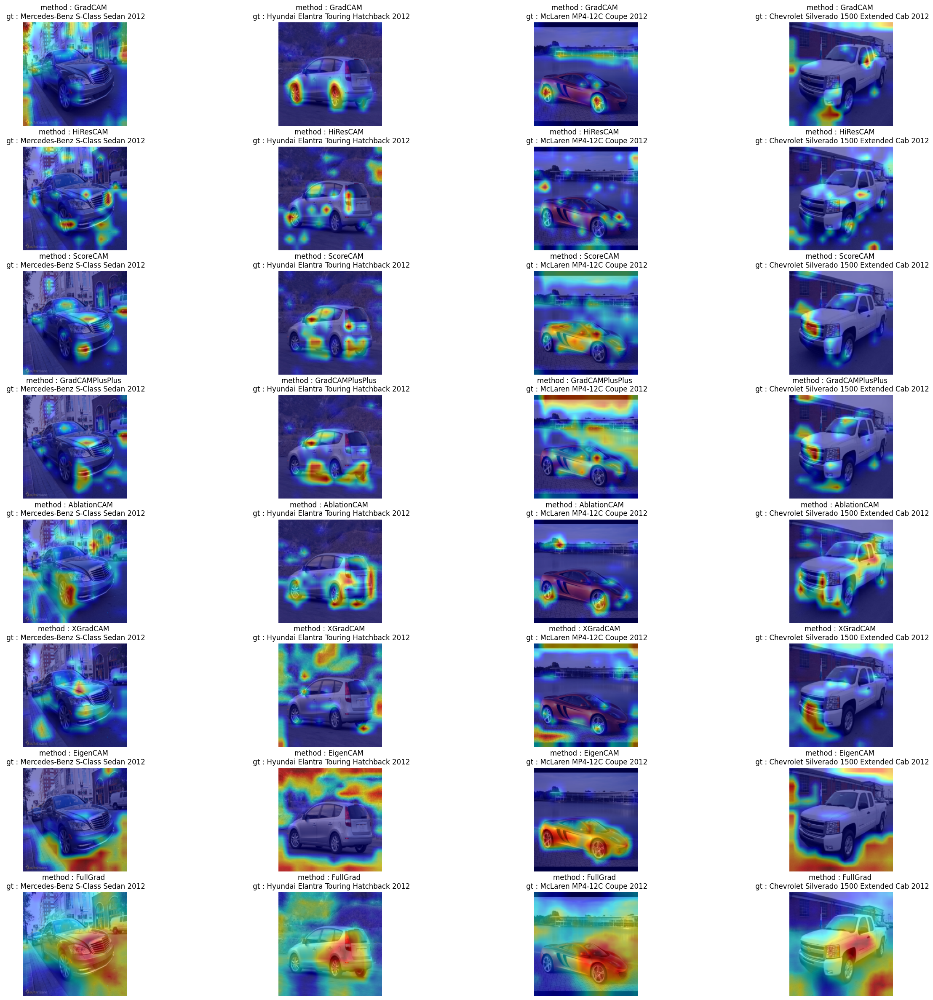

In [52]:
show_diff_grad_methods(pl_model.model, [ GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad])

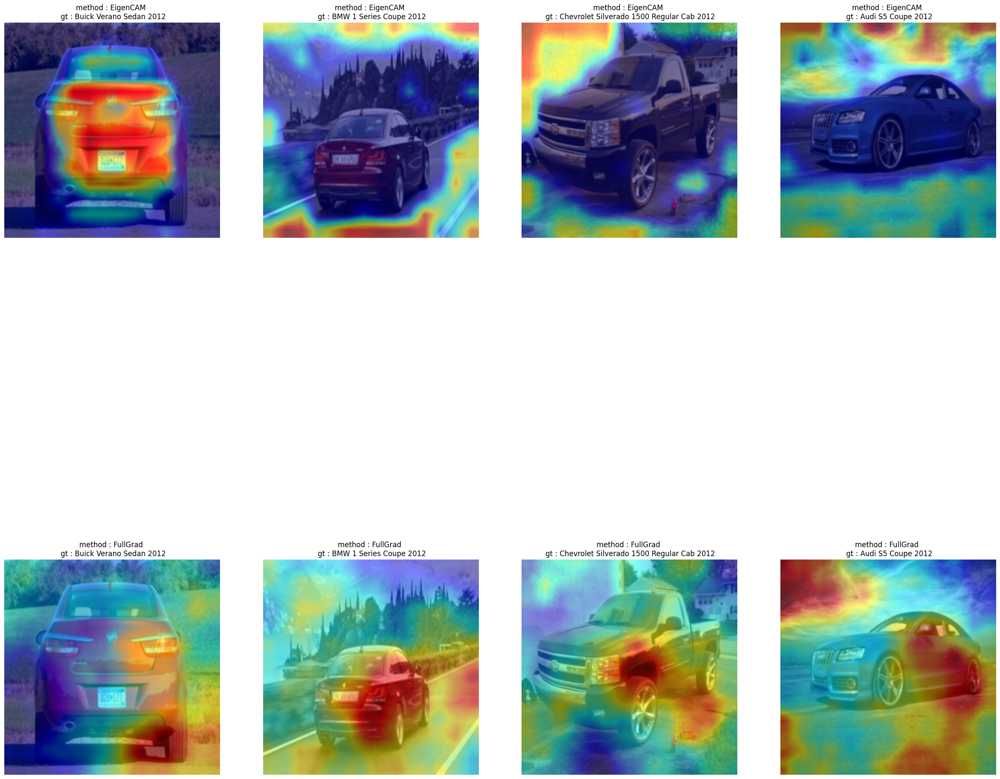

In [51]:
show_diff_grad_methods(pl_model.model, [EigenCAM, FullGrad])

# TensorBoard screenshots epochs = 12, 40

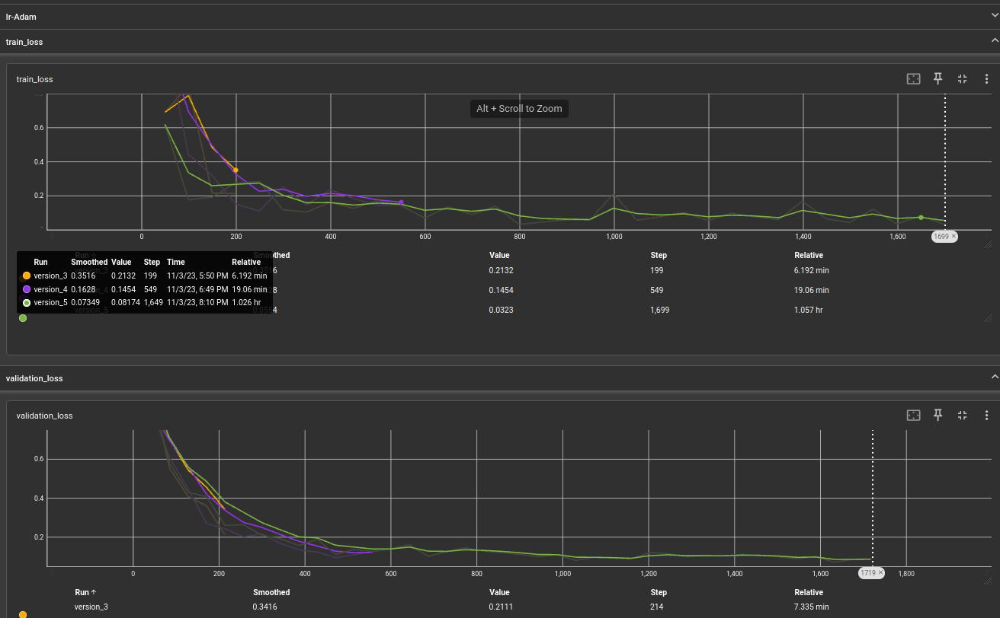

# Выводы
## 1. Я очень рад, что у меня закончилось познание CV части. Надеюсь больше никогда не вернусь к рассчетам размерности картинок и всем вот этим.
## 2. Модель mobilenetv2 точно хуже resnet50. Что бы я не делал, замена на resnet мне показывала лучше результат, хоть и все равно по precision меньше 30 процентов.
## 3. Mobilenetv2 я обучал с разными функциями потерь. Лучше всего показало начальное CE + CenterLoss. TripletLoss я реализовал в виде двух разных подходов, оба приведены в виде метрик и результатов GrudCum выше, и в обоих случаях получалось не очень
## 4. Я замучился скачивать мои lightning logs, открывать их локально через tensorboard и только после этого узнавать, как ведет себя модель по ошибке.
# В итоге реализовал:
## 1. Аугментации
## 2. Triplet loss
## 3. Метрики
## 4. Показал результат на GrudCum


# TensorBoard (Not working)

In [ ]:
!DEBIAN_FRONTEND=noninteractive sudo curl -s https://ngrok-agent.s3.amazonaws.com/ngrok.asc | sudo tee /etc/apt/trusted.gpg.d/ngrok.asc >/dev/null && echo "deb https://ngrok-agent.s3.amazonaws.com buster main" | sudo tee /etc/apt/sources.list.d/ngrok.list && sudo apt update && sudo apt -y install ngrok

In [ ]:
!ngrok config add-authtoken 2Xa

In [ ]:
#%tensorboard --logdir /kaggle/working/logs/{NAME}/
import multiprocessing


pool = multiprocessing. Pool (processes = 10)

results_of_processes = [pool.apply-async(os.system, args=(cmd, ), callback = None )
                            for cmd in [
                            f"tensorboard --logdir /kaggle/working/ --host 0.0.0.0 -port 6006 &",
                            "ngrok http 6006 &"
                        ]]

In [ ]:
! curl -s http://localhost:4040/api/tunnels | python3 -c \
"import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"